**Atividade**

Agora é hora de aplicar o que aprendemos em sala.

Escolha um dos Dataset abaixo e treine um modelo de visão computacional para classificar as imagens. Explore o máximo do conteúdo vimos até aqui. Fale sobre a arquitetura usada, estratégia, resultado e conclusão.

*	Classificação de grãos de café – Conjunto de dados com imagens de grãos de café para classificação do nível de torrefação (Dark, Green, Light, Medium):
https://www.kaggle.com/datasets/gpiosenka/coffee-bean-dataset-resized-224-x-224

*	Classificação de gado por raça – Conjunto de dados com imagens de gados de diferentes raças para classificação (ex. Belmont, Gir, Jersey, etc.):
https://www.kaggle.com/datasets/iamshahadat/cattle

*	Detecção de insetos e pragas agrícolas em imagens – Conjunto com 12 diferentes espécies insetos e pragas agrícolas:
https://www.kaggle.com/datasets/vencerlanz09/agricultural-pests-image-dataset



# Tomato Detection


In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
import numpy as np
import matplotlib.pyplot as plt
import shutil
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.models import Model

In [ ]:
! kaggle datasets download -d vexxingbanana/dcn-checkpoint

Dataset URL: https://www.kaggle.com/datasets/iamshahadat/cattle
License(s): unknown
 98% 141M/144M [00:04<00:00, 42.1MB/s]
100% 144M/144M [00:04<00:00, 36.8MB/s]


In [ ]:
!unzip /content/cattle.zip

Archive:  /content/cattle.zip
  inflating: CattleBreed/Abondance/Abondance0.jpg  
  inflating: CattleBreed/Abondance/Abondance0_c.jpg  
  inflating: CattleBreed/Abondance/Abondance1.jpg  
  inflating: CattleBreed/Abondance/Abondance10.jpg  
  inflating: CattleBreed/Abondance/Abondance10_c.jpg  
  inflating: CattleBreed/Abondance/Abondance11.jpg  
  inflating: CattleBreed/Abondance/Abondance11_c.jpg  
  inflating: CattleBreed/Abondance/Abondance12.jpg  
  inflating: CattleBreed/Abondance/Abondance12_c.jpg  
  inflating: CattleBreed/Abondance/Abondance13.jpg  
  inflating: CattleBreed/Abondance/Abondance13_c.jpg  
  inflating: CattleBreed/Abondance/Abondance14.jpg  
  inflating: CattleBreed/Abondance/Abondance14_c.jpg  
  inflating: CattleBreed/Abondance/Abondance15.jpg  
  inflating: CattleBreed/Abondance/Abondance15_c.jpg  
  inflating: CattleBreed/Abondance/Abondance16.jpg  
  inflating: CattleBreed/Abondance/Abondance16_c.jpg  
  inflating: CattleBreed/Abondance/Abondance17.jpg  
  i

In [ ]:
!apt-get install tree
!tree -d CattleBreed

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 45 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 0s (142 kB/s)
Selecting previously unselected package tree.
(Reading database ... 123586 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...
CattleBreed
├── Abondance
├── Afrikaner
├── Albera
├── AmericanMilkingDevon
├── Angus
├── AnkoleWatusi
├── Aquitaine
├── Argentine
├── Armorican
├── Arouquesa
├── Asturian
├── AustralianBraford
├── Bargur
├── Barzona
├── Bazadaise
├── Belgian
├── Belmont
├── BlackHereford
├── BlondeAquit

In [ ]:
import numpy as np
classes = np.squeeze([['Abondance'],
 ['Afrikaner'],
 ['Albera'],
 ['AmericanMilkingDevon'],
 ['Angus']
 ,['AnkoleWatusi']
 ,['Aquitaine']
 ,['Argentine']
 ,['Armorican']
 ,['Arouquesa']
 ,['Asturian']
 ,['AustralianBraford']
 ,['Bargur']
 ,['Barzona']
 ,['Bazadaise']
 ,['Belgian']
 ,['Belmont']
 ,['BlackHereford']
 ,['BlondeAquitaine']
 ,['Boran']
 ,['Braford']
 ,['Brahman']
 ,['Brangus']
 ,['Braunvieh']
 ,['Brava']
 ,['Burlina']
 ,['Busa']
 ,['Cachena']
 ,['Camargue']
 ,['CanadianSpeckle']
 ,['Canadienne']
 ,['Canchim']
 ,['Caracu']
 ,['Casta']
 ,['Charolais']
 ,['Chianina']
 ,['Corriente']
 ,['Corsican']
 ,['Criollo']
 ,['Dangi']
 ,['DanishRed']
 ,['Deoni']
 ,['Devon']
 ,['Dexter']
 ,['Dhannir']
 ,['Droughtmaster']
 ,['DutchBelted']
 ,['EnglishLonghorn']
 ,['Evolene']
 ,['Fjall']
 ,['Fleckvlehl']
 ,['FloridaCracker']
 ,['Galloway']
 ,['Gangatiri']
 ,['Gaolao']
 ,['Gascon']
 ,['Gelbvieh']
 ,['GermanAngus']
 ,['Gir']
 ,['Glan']
 ,['Gloucester']
 ,['HackCattle']
 ,['Halikar']
 ,['Haryana']
 ,['Hereford']
 ,['Highland']
 ,['Hinterwald']
 ,['HolandoArgentio']
 ,['HungarianGrey']
 ,['Icelandic']
 ,['Jutland']
 ,['Kangayam']
 ,['Kankrej']
 ,['Kerry']
 ,['KrishnaValley']
 ,['Kuri']
 ,['LatvianBrowni']
 ,['Lohani']
 ,['Lowline']
 ,['Luing']
 ,['Malvi']
 ,['Maronesa']
 ,['Mewati']
 ,['MilkingShorthorn']
 ,['Mirandesa']
 ,['Montb├йliarde']
 ,['Murboden']
 ,['brownSwiss']
 ,['herens']
 ,['jersey']])

In [ ]:
import os
from PIL import Image
import tensorflow as tf
import matplotlib.pyplot as plt


def decode_img(file_path):
    img = tf.io.read_file(file_path)

    img = tf.image.decode_image(img, channels=3)  # Specify channels if needed (e.g., 3 for RGB)
    return img

# Função para verificar se o arquivo é uma imagem válida
def verificar_imagem_valida(diretorio):
    formatos_validos = ('.jpeg', '.jpg','.png', '.gif', '.bmp')
    for raiz, _, arquivos in os.walk(diretorio):
        for arquivo in arquivos:
            caminho_arquivo = os.path.join(raiz, arquivo)


            #print(caminho_arquivo)
            if not caminho_arquivo.lower().endswith(formatos_validos):
                print(f"Removendo arquivo inválido: {caminho_arquivo}")
                os.remove(caminho_arquivo)
            else:
                try:
                    img = Image.open(caminho_arquivo)
                    img.verify()  # Verifica se a imagem pode ser aberta
                except (IOError, SyntaxError) as e:
                    print(f"Removendo imagem corrompida: {caminho_arquivo}")
                    os.remove(caminho_arquivo)
            try:
              image_deco = decode_img(caminho_arquivo)
              print("Image successfully decoded")
            except Exception as e:
              print(f"Error decoding image: {e}")
              os.remove(caminho_arquivo)

for c in classes:
  # Diretório contendo as imagens
  diretorio_teste = '/content/CattleBreed/'+c
  print(diretorio_teste )
  # print(diretorio_teste)
  # Verificar e remover arquivos inválidos antes de carregar os dados
  verificar_imagem_valida(diretorio_teste)

/content/CattleBreed/Abondance
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decoded
Image successfully decod

**Verificando a primeira imagem de cada classe do CattleBreed**

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Caminho da pasta que contém as subpastas com as imagens
pasta_origem = '/content/CattleBreed'

# Percorrer todas as subpastas na pasta de origem
for subdir, _, files in os.walk(pasta_origem):
    # Encontrar a primeira imagem na subpasta
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff')):
            # Caminho completo do arquivo na pasta de origem
            caminho_arquivo_origem = os.path.join(subdir, file)

            # Carregar a imagem
            imagem = Image.open(caminho_arquivo_origem)

            # Exibir a imagem
            plt.imshow(imagem)
            plt.title(f'Diretório: {os.path.basename(subdir)}')
            plt.axis('off')  # Ocultar os eixos
            plt.show()

            # Sair do loop após encontrar a primeira imagem
            break


Output hidden; open in https://colab.research.google.com to view.

**Criar o dataset no Tensor Flow**

In [ ]:
! pip install -q tensorflow tensorflow_datasets

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
import numpy as np
import matplotlib.pyplot as plt
import shutil

In [ ]:
# Caminho para o diretório de dados
data_dir = "/content/CattleBreed"

# Criar dataset a partir do diretório
dataset = image_dataset_from_directory(
    data_dir,
    labels='inferred',
    label_mode='int',
    image_size=(512, 512), # Tamanho das imagens
    batch_size=32, # Tamanho do lote
    shuffle=True
)

Found 4478 files belonging to 90 classes.


**Obter as classes das imagens**

In [ ]:
class_names = dataset.class_names
print(np.asarray(class_names).reshape(-1,1))

[['Abondance']
 ['Afrikaner']
 ['Albera']
 ['AmericanMilkingDevon']
 ['Angus']
 ['AnkoleWatusi']
 ['Aquitaine']
 ['Argentine']
 ['Armorican']
 ['Arouquesa']
 ['Asturian']
 ['AustralianBraford']
 ['Bargur']
 ['Barzona']
 ['Bazadaise']
 ['Belgian']
 ['Belmont']
 ['BlackHereford']
 ['BlondeAquitaine']
 ['Boran']
 ['Braford']
 ['Brahman']
 ['Brangus']
 ['Braunvieh']
 ['Brava']
 ['Burlina']
 ['Busa']
 ['Cachena']
 ['Camargue']
 ['CanadianSpeckle']
 ['Canadienne']
 ['Canchim']
 ['Caracu']
 ['Casta']
 ['Charolais']
 ['Chianina']
 ['Corriente']
 ['Corsican']
 ['Criollo']
 ['Dangi']
 ['DanishRed']
 ['Deoni']
 ['Devon']
 ['Dexter']
 ['Dhannir']
 ['Droughtmaster']
 ['DutchBelted']
 ['EnglishLonghorn']
 ['Evolene']
 ['Fjall']
 ['Fleckvlehl']
 ['FloridaCracker']
 ['Galloway']
 ['Gangatiri']
 ['Gaolao']
 ['Gascon']
 ['Gelbvieh']
 ['GermanAngus']
 ['Gir']
 ['Glan']
 ['Gloucester']
 ['HackCattle']
 ['Halikar']
 ['Haryana']
 ['Hereford']
 ['Highland']
 ['Hinterwald']
 ['HolandoArgentio']
 ['HungarianGr

**Dividir a base de dados em treino e teste**

In [ ]:
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = int(0.1 * len(dataset))

# # Normalização das imagens (0-255 para 0-1)
# normalization_layer = tf.keras.layers.Rescaling(1./255)
# normalized_ds = dataset.map(lambda x, y: (normalization_layer(x), y))

train_ds = dataset.take(train_size)
val_ds = dataset.skip(train_size).take(val_size)
test_ds = dataset.skip(train_size + val_size).take(test_size)


print('Proporção dos dados de Treino Teste e Validção dentro do Batch')
print(f'batch: {len(dataset)}')
print(f'Train: {train_size}')
print(f'Test: {test_size}')
print(f'Validation : {val_size}')

Proporção dos dados de Treino Teste e Validção dentro do Batch
batch: 140
Train: 112
Test: 14
Validation : 14


**Verificar uma amostra nos dados do batch de treino, teste e validação**

In [ ]:
# Função para plotar uma amostra do dataset
def plot_sample_from_dataset(dataset, num_images):
    # Pegar um lote de amostras do dataset
    for image_batch, label_batch in dataset.take(1):
        plt.figure(figsize=(10, 10))
        for i in range(num_images):
            ax = plt.subplot(5, 5, i + 1)
            plt.imshow(image_batch[i].numpy().astype("uint8"))
            plt.title(f'Amostra: {label_batch[i].numpy()}')
            plt.axis("off")
        plt.show()


In [ ]:
dataset.take(1)

<_TakeDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [ ]:
for image_batch, label_batch in dataset.take(1):
  print(image_batch)
  print(label_batch)

tf.Tensor(
[[[[ 62.         80.         40.       ]
   [ 65.78906    83.78906    43.789062 ]
   [ 71.64844    89.64844    49.648438 ]
   ...
   [101.96484   119.96484    59.964844 ]
   [101.37891   119.37891    59.378906 ]
   [101.        119.         59.       ]]

  [[ 63.13672    81.13672    41.13672  ]
   [ 66.63864    84.63864    44.63864  ]
   [ 72.053986   90.053986   50.053986 ]
   ...
   [101.96484   119.96484    59.964844 ]
   [101.37891   119.37891    59.378906 ]
   [101.        119.         59.       ]]

  [[ 64.89453    82.89453    42.89453  ]
   [ 67.95242    85.95242    45.952423 ]
   [ 72.68112    90.68112    50.68112  ]
   ...
   [101.96484   119.96484    59.964844 ]
   [101.37891   119.37891    59.378906 ]
   [101.        119.         59.       ]]

  ...

  [[120.03516   118.03516    80.03516  ]
   [120.021835  118.021835   79.65625  ]
   [120.001236  118.001236   79.07031  ]
   ...
   [130.10423   118.10423    78.10423  ]
   [131.84145   119.841446   79.841446 ]
   [1

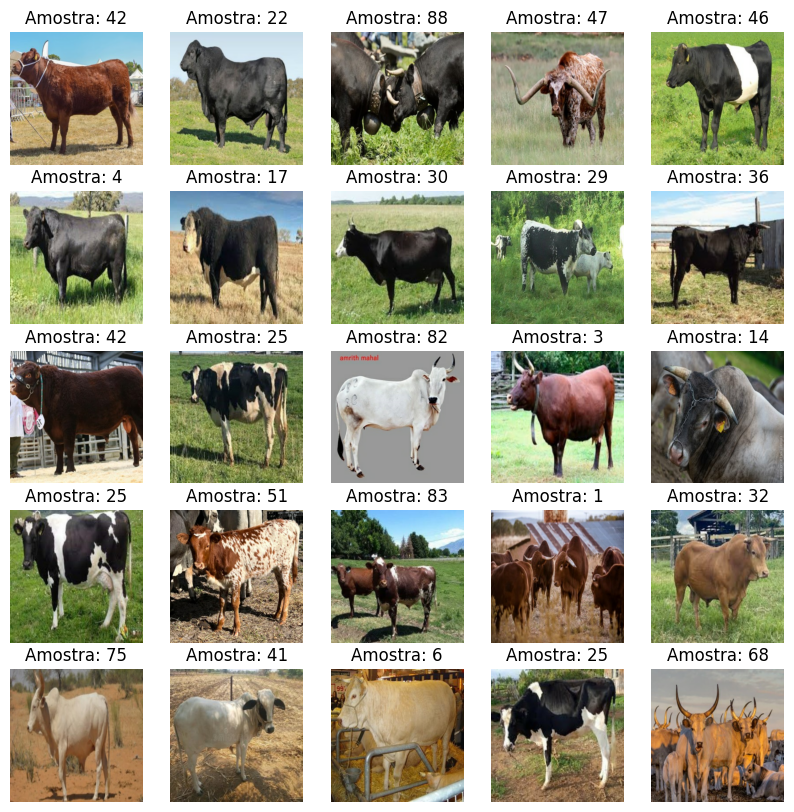

In [ ]:
# Plotar uma amostra do dataset de treino
plot_sample_from_dataset(train_ds, 25)  # Ajuste o número de imagens conforme necessário

In [ ]:

# Obter nomes das classes
class_names = dataset.class_names

# Função para plotar uma amostra do dataset
def plot_sample_from_dataset(dataset, num_images, class_names):
    # Pegar um lote de amostras do dataset
    for image_batch, label_batch in dataset.take(1):
        plt.figure(figsize=(20, 20))
        for i in range(num_images):
            ax = plt.subplot(5, 5, i + 1)
            plt.imshow(image_batch[i].numpy().astype("uint8"))
            class_label = class_names[label_batch[i].numpy()]
            plt.title(f'Amostra: {label_batch[i].numpy()}\nClasse: {class_label}')
            plt.axis("off")
        plt.show()



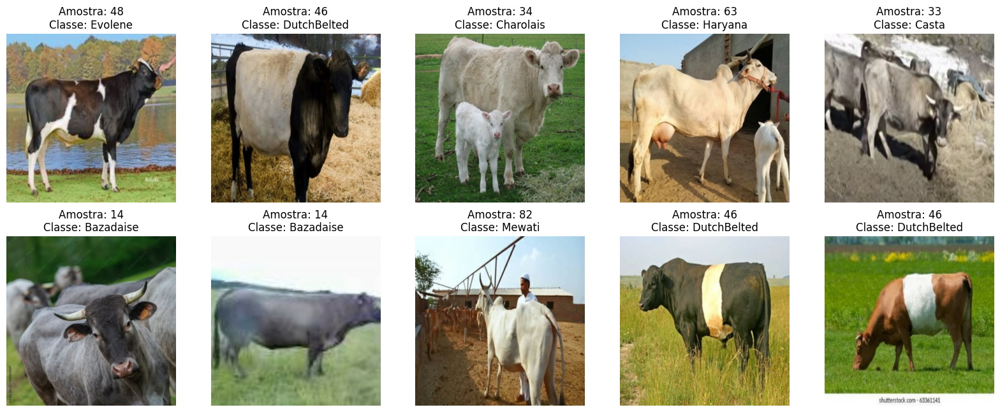

In [ ]:
# Plotar uma amostra do dataset de treino
plot_sample_from_dataset(train_ds, 10, class_names)  # Ajuste o número de imagens conforme necessário

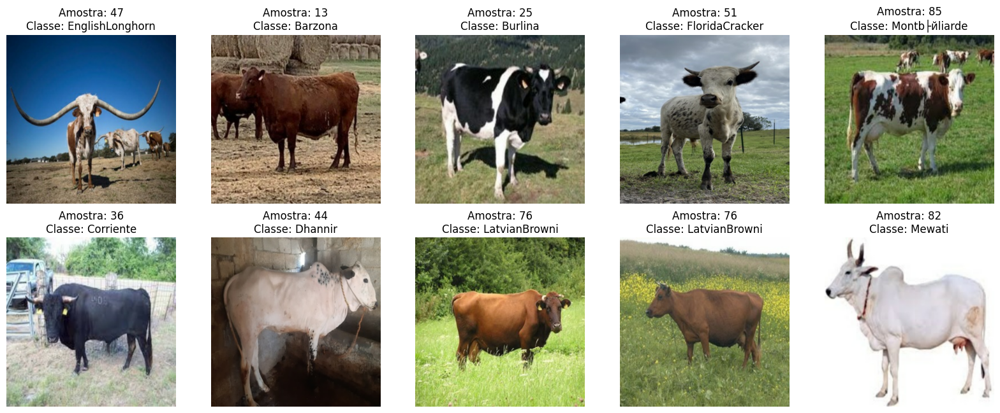

In [ ]:
# Plotar uma amostra do dataset de teste
plot_sample_from_dataset(test_ds, 10, class_names)  # Ajuste o número de imagens conforme necessário

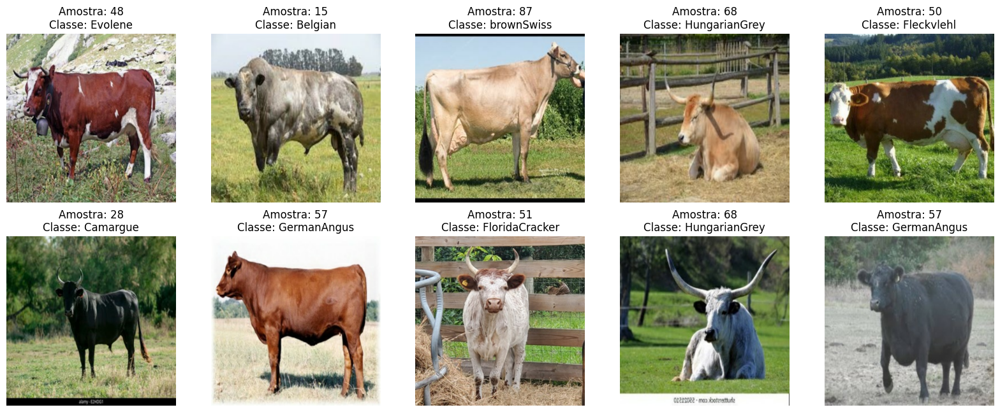

In [ ]:
# Plotar uma amostra do dataset de validação
plot_sample_from_dataset(val_ds, 10, class_names)  # Ajuste o número de imagens conforme necessário

**Balanceamento de classes no dataset de treino**

In [ ]:
labels_ =[label_batch for image_batch, label_batch in train_ds.take(1)]
labels_ = labels_[0].numpy()
labels_ = list(labels_)
print(labels_)

[59, 28, 3, 71, 75, 47, 69, 14, 13, 88, 6, 73, 46, 38, 6, 48, 25, 61, 68, 4, 9, 19, 40, 34, 58, 58, 20, 73, 68, 65, 40, 79]


In [ ]:
class_train = [class_names[i] for i in labels_]
print(class_train)

['Glan', 'Camargue', 'AmericanMilkingDevon', 'Kangayam', 'Kuri', 'EnglishLonghorn', 'Icelandic', 'Bazadaise', 'Barzona', 'herens', 'Aquitaine', 'Kerry', 'DutchBelted', 'Criollo', 'Aquitaine', 'Evolene', 'Burlina', 'HackCattle', 'HungarianGrey', 'Angus', 'Arouquesa', 'Boran', 'DanishRed', 'Charolais', 'Gir', 'Gir', 'Braford', 'Kerry', 'HungarianGrey', 'Highland', 'DanishRed', 'Luing']


In [ ]:
import pandas as pd
df_classes = pd.DataFrame(class_train, columns=['Classe'])

In [ ]:
# Contagem de amostras do batch de treino
df_classes_count = df_classes['Classe'].value_counts()


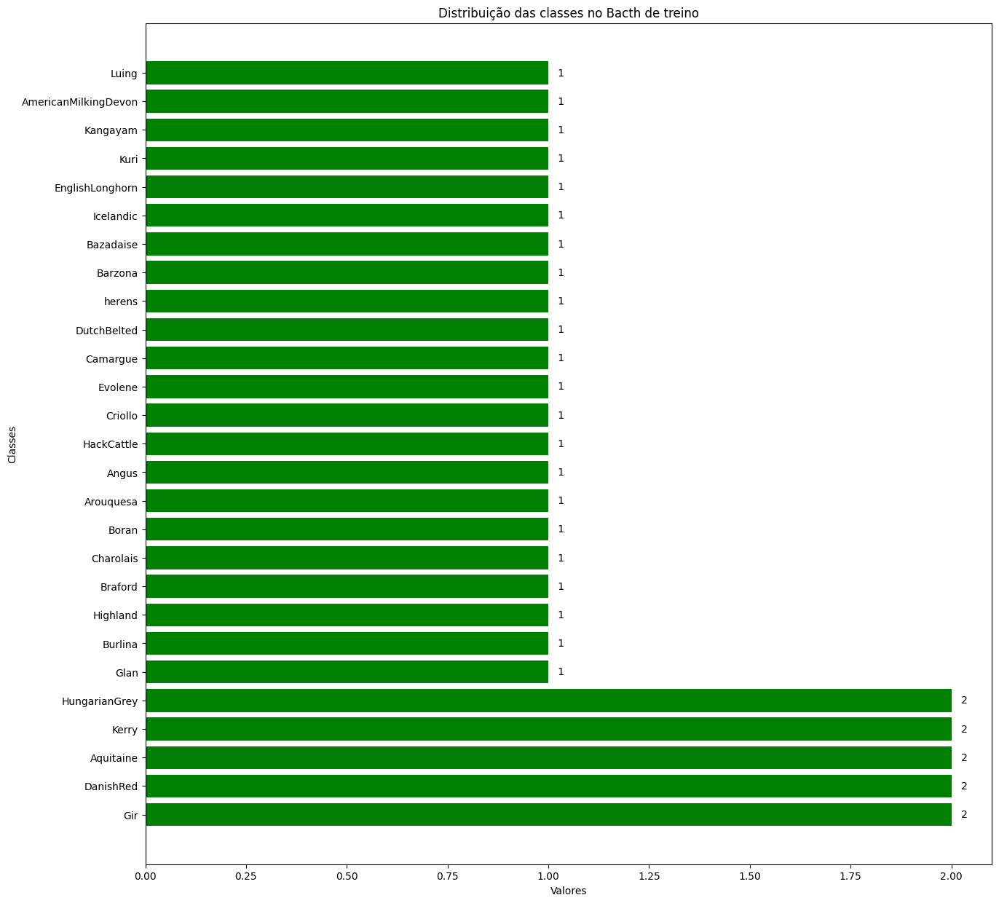

In [ ]:

# Criando o gráfico de barras horizontal
plt.figure(figsize=(15, 15))
bars = plt.barh(df_classes_count.index, df_classes_count.values, color='green')

# Adicionando os valores nas barras
for bar in bars:
    plt.text(
        bar.get_width(),
        bar.get_y() + bar.get_height()/2,
        f'   {bar.get_width()}',
        va='center'
    )

# Adicionando títulos e rótulos
plt.xlabel('Valores')
plt.ylabel('Classes')
plt.title('Distribuição das classes no Bacth de treino')

# Exibindo o gráfico
plt.show()

In [ ]:
# Fale sobre a arquitetura usada, estratégia, resultado e conclusão.

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model

**Adaptando as camadas finais da rede**

In [ ]:
num_classes = len(class_names)
print(num_classes)

90


**Construindo a rede**

In [ ]:
# Carregar o modelo pré-treinado EfficientNetV2L sem a camada de classificação final
pretrained_model = tf.keras.applications.efficientnet_v2.EfficientNetV2L(
    input_shape=(512, 512, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'  # Usa GlobalAveragePooling2D para reduzir a dimensionalidade
)


# Congelar as camadas do modelo pré-treinado
pretrained_model.trainable = False

In [ ]:
# Adicionar camadas personalizadas no topo do modelo pré-treinado
# Adicionar camadas personalizadas no topo do modelo pré-treinado
inputs = pretrained_model.input
x = pretrained_model.output  # Esta saída já está poolada globalmente
x = Dense(128, activation='relu')(x)  # Camada densa com 128 unidades e ativação ReLU
x = Dropout(0.5)(x)  # Adicionar Dropout para evitar overfitting
outputs = Dense(num_classes, activation='softmax')(x)  # Camada de saída com 12 classes


# Criar o modelo final
model = Model(inputs=inputs, outputs=outputs)

**Visualizando a estrutura da rede**

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 rescaling_1 (Rescaling)     (None, 512, 512, 3)          0         ['input_3[0][0]']             
                                                                                                  
 stem_conv (Conv2D)          (None, 256, 256, 32)         864       ['rescaling_1[0][0]']         
                                                                                                  
 stem_bn (BatchNormalizatio  (None, 256, 256, 32)         128       ['stem_conv[0][0]']           
 n)                                                                                         

**Compliando o Modelo**

In [ ]:
# Compile o modelo
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)



**Checkpoints - Salvando o Modelo**

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint

In [ ]:
# Caminho para salvar o melhor modelo
checkpoint_filepath = '/content/best_model.h5'

In [ ]:
# Configurar o callback para salvar o melhor modelo
checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True
)

**Treinando o modelo**

In [ ]:
# Treine o modelo
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=75,
    callbacks=[checkpoint_callback]

)

Epoch 1/75
112/112 [==============================] - ETA: 0s - loss: 4.4284 - accuracy: 0.0282

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


112/112 [==============================] - 333s 3s/step - loss: 4.4284 - accuracy: 0.0282 - val_loss: 4.2254 - val_accuracy: 0.0513
Epoch 2/75
112/112 [==============================] - 275s 2s/step - loss: 4.0644 - accuracy: 0.0678 - val_loss: 3.7111 - val_accuracy: 0.1250
Epoch 3/75
112/112 [==============================] - 275s 2s/step - loss: 3.6954 - accuracy: 0.1074 - val_loss: 3.3571 - val_accuracy: 0.2277
Epoch 4/75
112/112 [==============================] - 297s 3s/step - loss: 3.4267 - accuracy: 0.1320 - val_loss: 3.0274 - val_accuracy: 0.3013
Epoch 5/75
112/112 [==============================] - 290s 3s/step - loss: 3.2150 - accuracy: 0.1730 - val_loss: 2.8709 - val_accuracy: 0.3415
Epoch 6/75
112/112 [==============================] - 293s 3s/step - loss: 3.0174 - accuracy: 0.2165 - val_loss: 2.7293 - val_accuracy: 0.3996
Epoch 7/75
112/112 [==============================] - 279s 2s/step - loss: 2.8692 - accuracy: 0.2302 - val_loss: 2.4986 - val_accuracy: 0.4375
Epoch 8/75

**Avaliação do treino do Modelo**

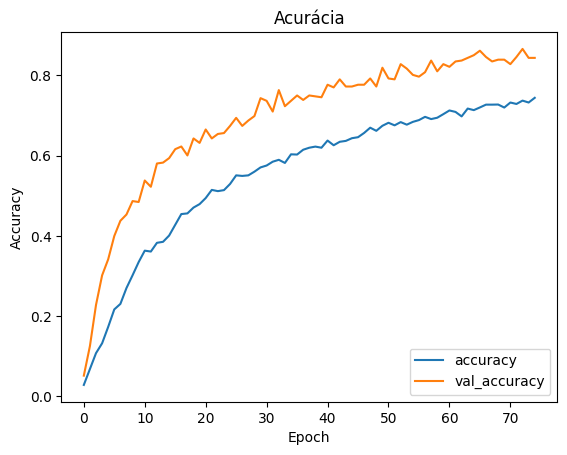

In [ ]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Acurácia')
# plt.ylim([0.5, 1])
plt.legend(loc='lower right')


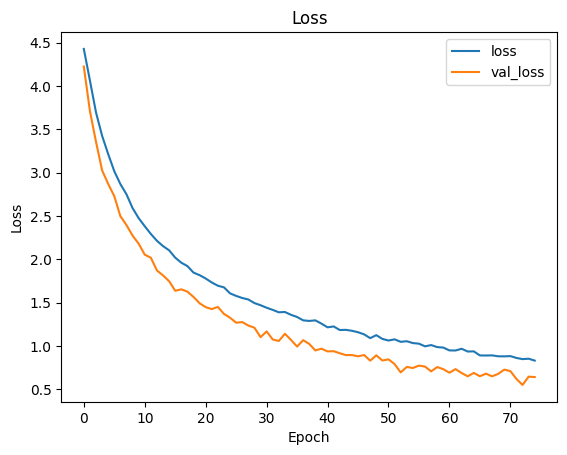

In [ ]:
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss')
# plt.ylim([0.5, 1])
plt.legend(loc='upper right')


**Avaliação do Modelo**

In [ ]:
# Avaliar o modelo nos dados de teste
test_loss, test_acc = model.evaluate(test_ds)
print(f'Test accuracy: {test_acc:.2f}')

14/14 [==============================] - 71s 3s/step - loss: 0.7935 - accuracy: 0.8139
Test accuracy: 0.81


**Predição**

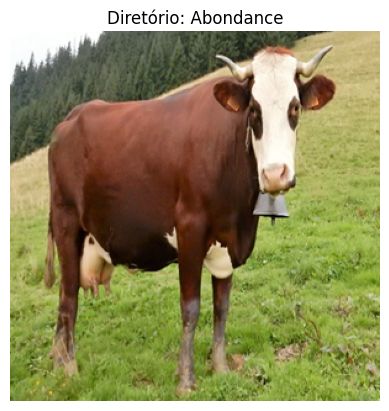

In [ ]:
from PIL import Image
imagem_test = '/content/CattleBreed/Abondance/Abondance0.jpg'
classe_= imagem_test.split('/')[3]
# Carregar a imagem
imagem = Image.open(imagem_test)

# Exibir a imagem
plt.imshow(imagem)
plt.title(f'Diretório: {classe_}')
plt.axis('off')  # Ocultar os eixos
plt.show()

In [ ]:
imagem_test = '/content/CattleBreed/Abondance/Abondance0.jpg'

image = tf.keras.preprocessing.image.load_img(
    imagem_test, target_size=(512, 512)
)

# Converter a imagem para um array NumPy
image_array = tf.keras.preprocessing.image.img_to_array(image)

# Normalizar a imagem
image_array = image_array / 255.0

# Adicionar uma dimensão extra para converter a imagem em um lote
image_batch = np.expand_dims(image_array, axis=0)

# Fazer uma previsão
predictions = model.predict(image_batch)

# Obter o índice da classe com a maior probabilidade
predicted_class_index = np.argmax(predictions)

# Obter o nome da classe
predicted_class_name = class_names[predicted_class_index]

# Imprimir o nome da classe prevista
print(f'Predicted class: {predicted_class_name}')

1/1 [==============================] - 0s 234ms/step
Predicted class: Barzona


In [ ]:
class_names

In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder

labels_encoder = LabelEncoder()

# Ajustar o LabelEncoder e transformar os rótulos categóricos em numéricos
rotulos_numericos = labels_encoder.fit_transform(class_names)

print("Rótulos categóricos:", class_names[:10])
print("Rótulos numéricos:", rotulos_numericos[:10])
print(rotulos_numericos.shape)


Rótulos categóricos: ['Abondance', 'Afrikaner', 'Albera', 'AmericanMilkingDevon', 'Angus', 'AnkoleWatusi', 'Aquitaine', 'Argentine', 'Armorican', 'Arouquesa']
Rótulos numéricos: [0 1 2 3 4 5 6 7 8 9]
(90,)


In [ ]:
import matplotlib.pyplot as plt

def plot_predictions_test(dataset_test, num_images):
    class_names = labels_encoder.classes_

    # Calcular o número total de imagens no dataset de teste
    total_images = sum(1 for _ in dataset_test.unbatch())
    if num_images > total_images:
        print(f"O número máximo de imagens é {total_images}.")
        num_images = total_images
        return

    plt.figure(figsize=(20, 20))
    count = 0
    for images, labels in dataset_test:
        predictions = model.predict(images)
        predicted_class_indices = np.argmax(predictions, axis=1)

        for i in range(num_images):
            image = images[i].numpy().astype("uint8")
            class_pred = class_names[predicted_class_indices[i]]
            class_real = class_names[labels.numpy()[i]]

            # Plotando o Gráfico
            ax = plt.subplot(5, 5, i + 1)
            plt.imshow(image)
            plt.title(f'Imagem: {i}\nClasse Real: {class_real}\nClasse Predita: {class_pred}')
            plt.axis("off")
    plt.show()



1/1 [==============================] - 1s 1s/step


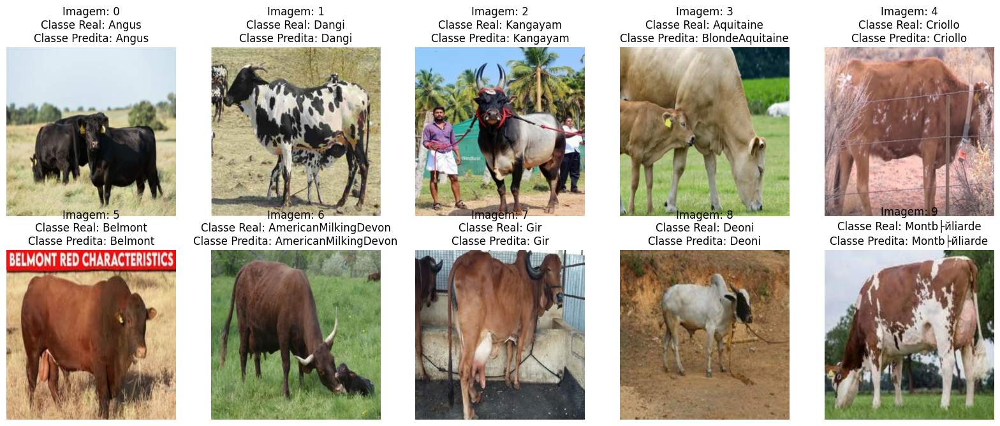

In [ ]:
# Chamar a função com um número de imagens desejado
plot_predictions_test(test_ds, num_images=10)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from PIL import Image

def plot_predictions(imagem):
    # Carregar a imagem
    Imagem = Image.open(imagem)

    # Converter a imagem para um array NumPy com tamanho correto
    image = tf.keras.preprocessing.image.load_img(imagem, target_size=(512, 512))
    image_array = tf.keras.preprocessing.image.img_to_array(image)


    # Adicionar uma dimensão extra para converter a imagem em um lote
    image_batch = np.expand_dims(image_array, axis=0)

    # Fazer uma previsão
    predictions = model.predict(image_batch)

    # Obter o índice da classe com a maior probabilidade
    predicted_class_index = np.argmax(predictions)

    # Obter o nome da classe predita
    class_pred = class_names[predicted_class_index]

    # Obter a classe real a partir do caminho da imagem
    class_real = imagem.split('/')[3]

    # Plotar o Gráfico
    plt.imshow(Imagem)
    plt.title(f'Classe Real: {class_real}\nClasse Predita: {class_pred}')
    plt.axis("off")
    plt.show()



1/1 [==============================] - 0s 88ms/step


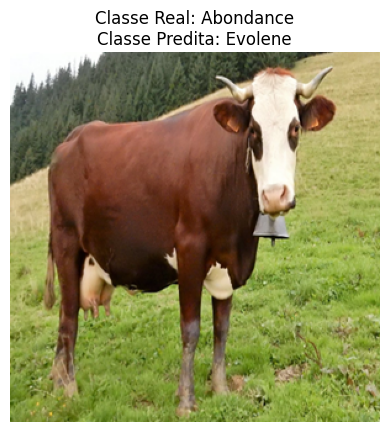

In [ ]:
# Chamar a função com o caminho da imagem
imagem = '/content/CattleBreed/Abondance/Abondance0.jpg'
plot_predictions(imagem)


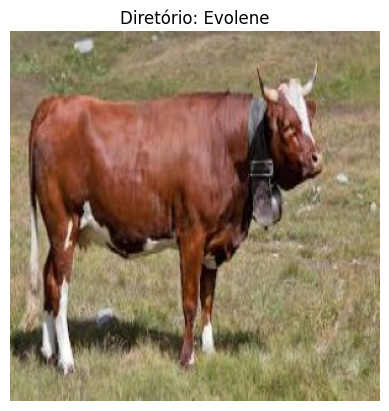

In [ ]:
from PIL import Image
imagem_test = '/content/CattleBreed/Evolene/Evolene0.jpg'
classe_= imagem_test.split('/')[3]
# Carregar a imagem
imagem = Image.open(imagem_test)

# Exibir a imagem
plt.imshow(imagem)
plt.title(f'Diretório: {classe_}')
plt.axis('off')  # Ocultar os eixos
plt.show()

1/1 [==============================] - 0s 110ms/step


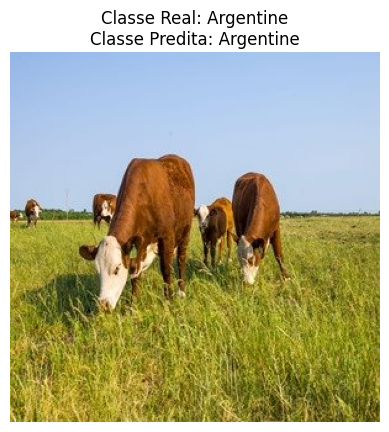

In [ ]:
# Chamar a função com o caminho da imagem
imagem = '/content/CattleBreed/Argentine/Argentine0.jpg'
plot_predictions(imagem)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil

# Caminho do arquivo no Colab
src_path = '/content/best_model.h5'

# Caminho do destino no Google Drive
dest_path = '/content/drive/MyDrive/Datasets/RacaGado/best_model.h5'

# Certifique-se de que o diretório de destino existe
shutil.copy(src_path, dest_path)

'/content/drive/MyDrive/Datasets/RacaGado/best_model.h5'

In [ ]:
# Carregar o modelo
model_path = '/content/drive/MyDrive/Datasets/RacaGado/best_model.h5'
model_best = tf.keras.models.load_model(model_path)

In [ ]:
# Avaliar o modelo nos dados de teste
test_loss, test_acc = model_best.evaluate(test_ds)
print(f'Test accuracy: {test_acc:.2f}')

14/14 [==============================] - 63s 2s/step - loss: 0.7690 - accuracy: 0.8161
Test accuracy: 0.82


In [ ]:
import matplotlib.pyplot as plt

def plot_predictions_test(dataset_test, num_images):
    class_names = labels_encoder.classes_

    # Calcular o número total de imagens no dataset de teste
    total_images = sum(1 for _ in dataset_test.unbatch())
    if num_images > total_images:
        print(f"O número máximo de imagens é {total_images}.")
        num_images = total_images
        return

    plt.figure(figsize=(20, 20))
    count = 0
    for images, labels in dataset_test:
        predictions = model_best.predict(images)
        predicted_class_indices = np.argmax(predictions, axis=1)

        for i in range(num_images):
            image = images[i].numpy().astype("uint8")
            class_pred = class_names[predicted_class_indices[i]]
            class_real = class_names[labels.numpy()[i]]

            # Plotando o Gráfico
            ax = plt.subplot(5, 5, i + 1)
            plt.imshow(image)
            plt.title(f'Imagem: {i}\nClasse Real: {class_real}\nClasse Predita: {class_pred}')
            plt.axis("off")
    plt.show()


1/1 [==============================] - 7s 7s/step


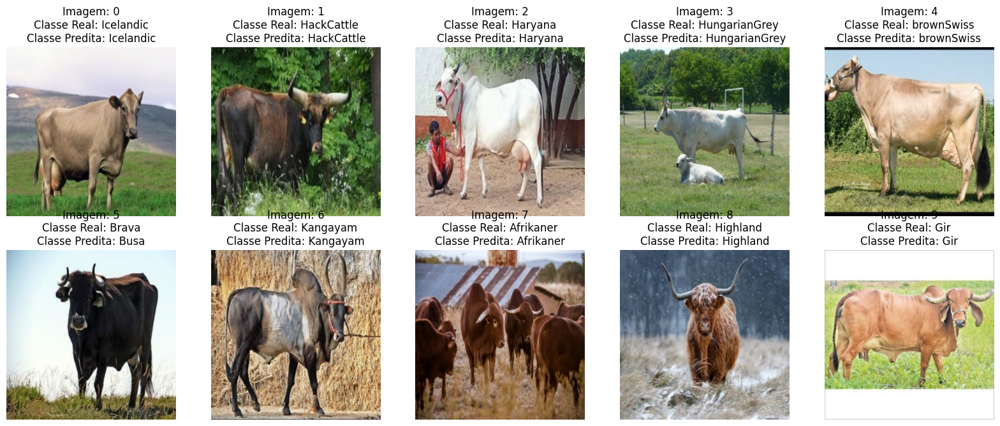

In [ ]:
# Chamar a função com um número de imagens desejado
plot_predictions_test(test_ds, num_images=10)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from PIL import Image

def plot_predictions(imagem):
    # Carregar a imagem
    Imagem = Image.open(imagem)

    # Converter a imagem para um array NumPy com tamanho correto
    image = tf.keras.preprocessing.image.load_img(imagem, target_size=(512, 512))
    image_array = tf.keras.preprocessing.image.img_to_array(image)


    # Adicionar uma dimensão extra para converter a imagem em um lote
    image_batch = np.expand_dims(image_array, axis=0)

    # Fazer uma previsão
    predictions = model_best.predict(image_batch)

    # Obter o índice da classe com a maior probabilidade
    predicted_class_index = np.argmax(predictions)

    # Obter o nome da classe predita
    class_pred = class_names[predicted_class_index]

    # Obter a classe real a partir do caminho da imagem
    class_real = imagem.split('/')[3]

    # Plotar o Gráfico
    plt.imshow(Imagem)
    plt.title(f'Classe Real: {class_real}\nClasse Predita: {class_pred}')
    plt.axis("off")
    plt.show()



1/1 [==============================] - 0s 108ms/step


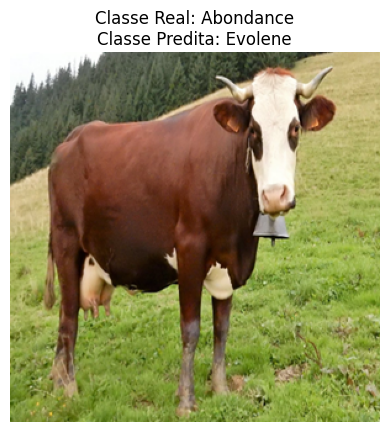

In [ ]:
# Chamar a função com o caminho da imagem
imagem = '/content/CattleBreed/Abondance/Abondance0.jpg'
plot_predictions(imagem)


1/1 [==============================] - 0s 78ms/step


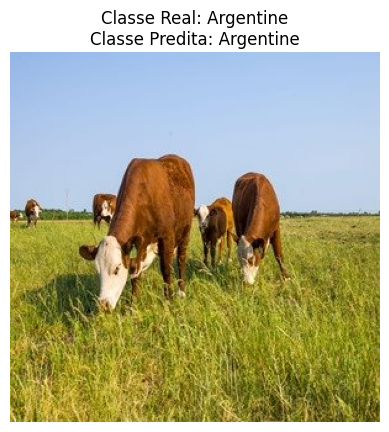

In [ ]:
# Chamar a função com o caminho da imagem
imagem = '/content/CattleBreed/Argentine/Argentine0.jpg'
plot_predictions(imagem)


1/1 [==============================] - 0s 72ms/step


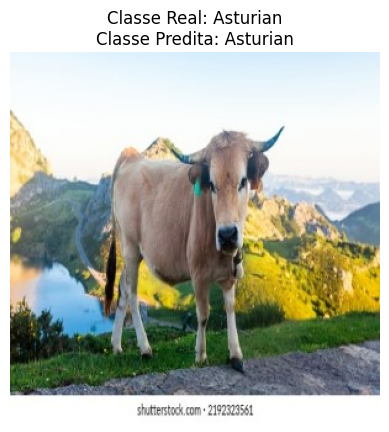

In [ ]:
# Chamar a função com o caminho da imagem
imagem = '/content/CattleBreed/Asturian/Asturian0.jpg'
plot_predictions(imagem)


In [ ]:
# Treine o modelo
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=75,
    callbacks=[checkpoint_callback]

)

Epoch 1/75
112/112 [==============================] - ETA: 0s - loss: 4.4284 - accuracy: 0.0282

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


112/112 [==============================] - 333s 3s/step - loss: 4.4284 - accuracy: 0.0282 - val_loss: 4.2254 - val_accuracy: 0.0513
Epoch 2/75
112/112 [==============================] - 275s 2s/step - loss: 4.0644 - accuracy: 0.0678 - val_loss: 3.7111 - val_accuracy: 0.1250
Epoch 3/75
112/112 [==============================] - 275s 2s/step - loss: 3.6954 - accuracy: 0.1074 - val_loss: 3.3571 - val_accuracy: 0.2277
Epoch 4/75
112/112 [==============================] - 297s 3s/step - loss: 3.4267 - accuracy: 0.1320 - val_loss: 3.0274 - val_accuracy: 0.3013
Epoch 5/75
112/112 [==============================] - 290s 3s/step - loss: 3.2150 - accuracy: 0.1730 - val_loss: 2.8709 - val_accuracy: 0.3415
Epoch 6/75
112/112 [==============================] - 293s 3s/step - loss: 3.0174 - accuracy: 0.2165 - val_loss: 2.7293 - val_accuracy: 0.3996
Epoch 7/75
112/112 [==============================] - 279s 2s/step - loss: 2.8692 - accuracy: 0.2302 - val_loss: 2.4986 - val_accuracy: 0.4375
Epoch 8/75

In [ ]:
# Avaliar o modelo nos dados de teste
test_loss, test_acc = model_best.evaluate(test_ds)
print(f'Test accuracy: {test_acc:.2f}')

14/14 [==============================] - 63s 2s/step - loss: 0.7690 - accuracy: 0.8161
Test accuracy: 0.82


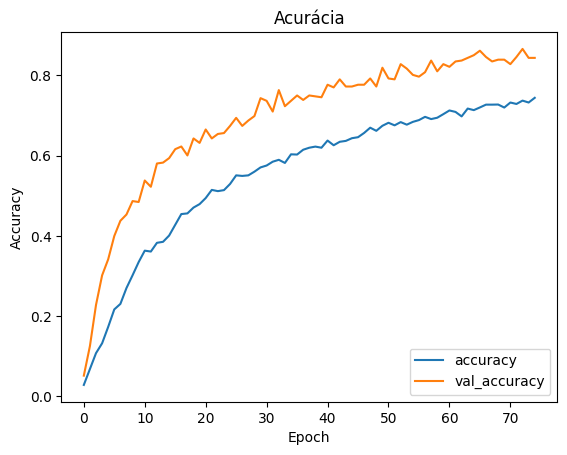

In [ ]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Acurácia')
# plt.ylim([0.5, 1])
plt.legend(loc='lower right')


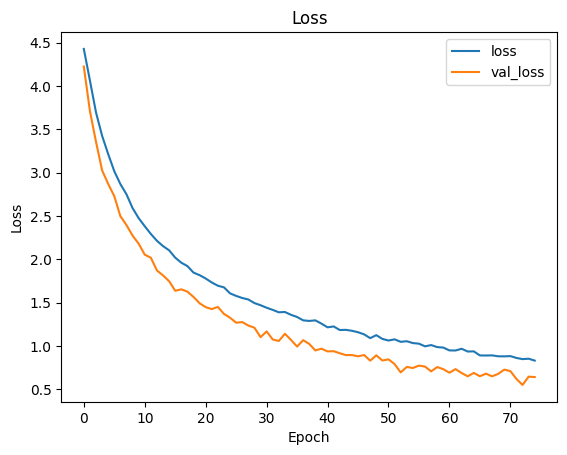

In [ ]:
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss')
# plt.ylim([0.5, 1])
plt.legend(loc='upper right')


1/1 [==============================] - 1s 1s/step


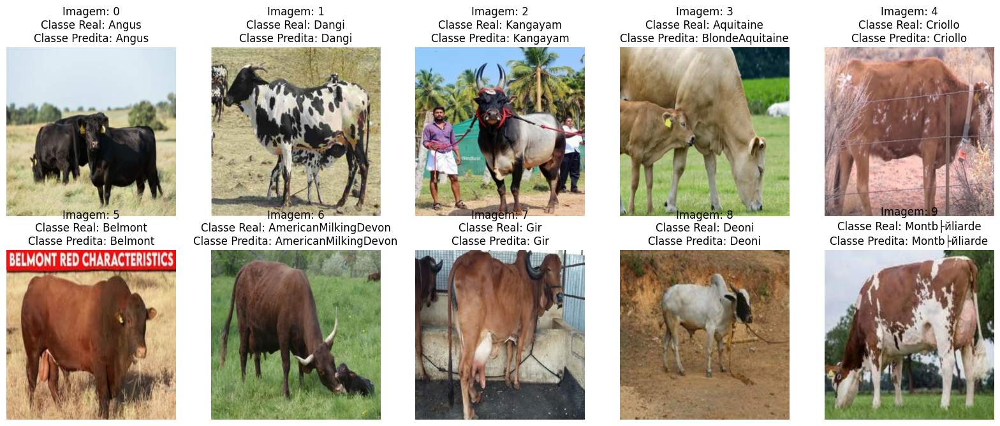

In [ ]:
# Chamar a função com um número de imagens desejado
plot_predictions_test(test_ds, num_images=10)

1/1 [==============================] - 7s 7s/step


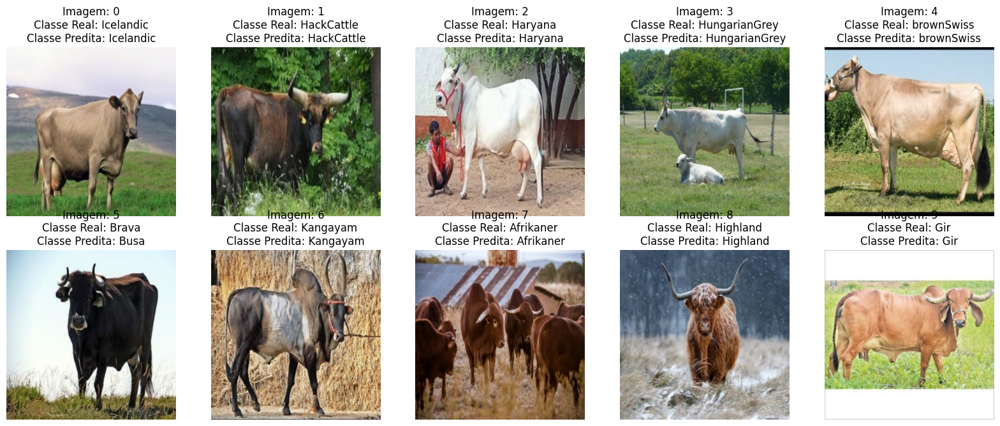

In [ ]:
# Chamar a função com um número de imagens desejado
plot_predictions_test(test_ds, num_images=10)

1/1 [==============================] - 0s 108ms/step


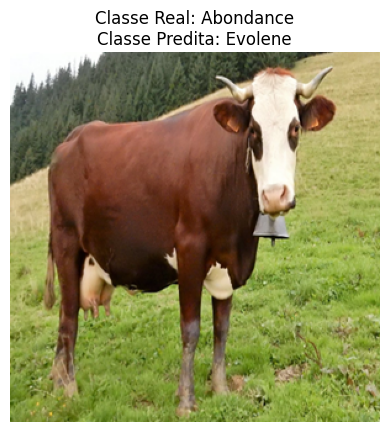

In [ ]:
# Chamar a função com o caminho da imagem
imagem = '/content/CattleBreed/Abondance/Abondance0.jpg'
plot_predictions(imagem)


1/1 [==============================] - 0s 78ms/step


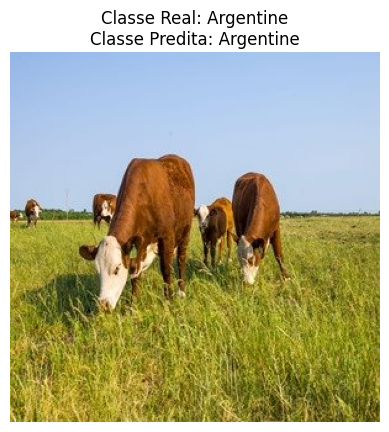

In [ ]:
# Chamar a função com o caminho da imagem
imagem = '/content/CattleBreed/Argentine/Argentine0.jpg'
plot_predictions(imagem)


1/1 [==============================] - 0s 72ms/step


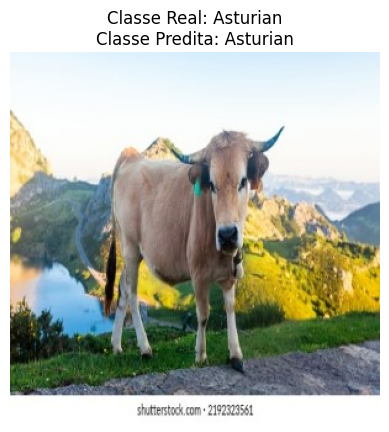

In [ ]:
# Chamar a função com o caminho da imagem
imagem = '/content/CattleBreed/Asturian/Asturian0.jpg'
plot_predictions(imagem)
